# DERIBIT API EXPLORATION

In [1]:
import numpy as np 

Start with the API key and secret code (Dont replicate, create ur own, there is a limit for minute request)

In [2]:
import websocket
import json
# Your Deribit credentials
api_key = 'x_uXagP8'
api_secret = 'ygSW1HwArk2tVnDU_FpByAZLMPJkaUx51Y56NS24DrI'

Index: Deribit create an bitcoin Index with data from Bitstamp, Coinbase Pro, Kraken, LMAX digital and others.
Open interest: total number of options that have not settled.
Underlying price: current market price of the asset or financial instrument in wich the option is based.
Index price: Price of the index.

## Get_Instruments

https://docs.deribit.com/#public-get_instruments 

Retrieves available trading instruments. This method can be used to see which instruments are available for trading, or which instruments have recently expired.

In [4]:


# Establish a connection to Deribit's WebSocket API
ws = websocket.create_connection('wss://www.deribit.com/ws/api/v2')

# Define your authentication message
auth_message = {
    "jsonrpc": "2.0",
    "id": 1,
    "method": "public/auth",
    "params": {
        "grant_type": "client_credentials",
        "client_id": api_key,
        "client_secret": api_secret
    }
}

# Send the authentication message
ws.send(json.dumps(auth_message))
response = ws.recv()
print(response)

# Define a message to get option trading information
options_message = {
    "jsonrpc": "2.0",
    "id": 2,
    "method": "public/get_instruments",
    "params": {
        "currency": "BTC",
        "kind": "option",
        "expired": False
    }
}

# Send the message to get options information
ws.send(json.dumps(options_message))
options_response = ws.recv()
print(options_response)

# Close the WebSocket connection
ws.close()


{"jsonrpc":"2.0","id":1,"result":{"token_type":"bearer","scope":"name:MQE block_trade:read connection trade:read wallet:read account:read custody:read mainaccount","refresh_token":"1746731311370.1bRxzjgq.6gWWJipwIWB0to3_iyuYxa69GxR1S0dV2uNF7huYWJMd_QggMV362-kIyKR067pLhR-O9yMDc7ZBQkNVSG3Foo3-SiVz65T228BDRS7p0ck0VjQst8PiHoiHjK7jsEk9_WDz3wnxpZuGVMG333JU1AwZjcobKptNZ9ZR-VclH13PL0aD7_tDivdnluoDg4jsU4F283dO4EbDJoA1KD9ZdnLnosJ9YVn6VoTzmIxNa82ZKOEh4_ff4YhlvKBALl1KWwz8Vd2KhjP-Y1sQOj11Z5jtUYDGVgH-geQMN5v7vSK_41AGfoLfAdJ1sWY","expires_in":31536000,"access_token":"1746731311370.1RJoaugk.l4cSZFcGlVD6eE-RS24wIqgTO_YZJuI-72mItieo2BT2DPuxMr-zs6SdLkyunXHDFhGxQuAkEqkYY8ky_BlzYjww1D6IcH3IakG4qXtvPTIm5hvoIIpAhy_ayCTAWgh4nfwg5OQlvsSab8mAgNkyYgK6fq09F4VY-9Y29ajFpdZKZrfNbWQDSMvejTS9gjysGbRPub_1Ww7m8tqoybUQFUW9HAz9HUGkWhNvZAA4xWsyz0mHqfIIvoGebNxNzi77bKkqTAGdgaucDai3q-MdCnLGSEAyPlkb0lWwjAuaX8hsTggrpReszYWcODdK"},"usIn":1715195311369935,"usOut":1715195311370231,"usDiff":296,"testnet":false}
{"jsonrpc":"2.0","id

In [3]:
json.loads(options_response)['result'][:5]

[{'tick_size_steps': [{'above_price': 0.005, 'tick_size': 0.0005}],
  'quote_currency': 'BTC',
  'min_trade_amount': 0.1,
  'counter_currency': 'USD',
  'settlement_period': 'week',
  'settlement_currency': 'BTC',
  'block_trade_tick_size': 0.0001,
  'block_trade_min_trade_amount': 25,
  'block_trade_commission': 0.0003,
  'option_type': 'call',
  'creation_timestamp': 1714263493000,
  'instrument_id': 321194,
  'base_currency': 'BTC',
  'tick_size': 0.0001,
  'contract_size': 1.0,
  'strike': 44000.0,
  'is_active': True,
  'expiration_timestamp': 1714723200000,
  'instrument_type': 'reversed',
  'instrument_name': 'BTC-3MAY24-44000-C',
  'taker_commission': 0.0003,
  'maker_commission': 0.0003,
  'kind': 'option',
  'rfq': False,
  'price_index': 'btc_usd'},
 {'tick_size_steps': [{'above_price': 0.005, 'tick_size': 0.0005}],
  'quote_currency': 'BTC',
  'min_trade_amount': 0.1,
  'counter_currency': 'USD',
  'settlement_period': 'week',
  'settlement_currency': 'BTC',
  'block_trade_

In [5]:
import json

# Assuming options_response is the JSON formatted string received from the Deribit API
options_response_2 = options_response

# Parse the JSON response
parsed_response = json.loads(options_response)

# Extract the result which contains the list of instruments
instruments = parsed_response.get('result', [])

# Format and print the information in a more readable way
for instrument in instruments:
    print(f"Instrument Name: {instrument['instrument_name']}")
    print(f"Base Currency: {instrument['base_currency']}")
    print(f"Strike: {instrument['strike']}")
    print(f"Option Type: {instrument['option_type']}")
    print(f"Settlement Period: {instrument['settlement_period']}")
    print("\n")


Instrument Name: BTC-3MAY24-44000-C
Base Currency: BTC
Strike: 44000.0
Option Type: call
Settlement Period: week


Instrument Name: BTC-3MAY24-44000-P
Base Currency: BTC
Strike: 44000.0
Option Type: put
Settlement Period: week


Instrument Name: BTC-3MAY24-50000-C
Base Currency: BTC
Strike: 50000.0
Option Type: call
Settlement Period: week


Instrument Name: BTC-3MAY24-50000-P
Base Currency: BTC
Strike: 50000.0
Option Type: put
Settlement Period: week


Instrument Name: BTC-3MAY24-52000-C
Base Currency: BTC
Strike: 52000.0
Option Type: call
Settlement Period: week


Instrument Name: BTC-3MAY24-52000-P
Base Currency: BTC
Strike: 52000.0
Option Type: put
Settlement Period: week


Instrument Name: BTC-3MAY24-54000-C
Base Currency: BTC
Strike: 54000.0
Option Type: call
Settlement Period: week


Instrument Name: BTC-3MAY24-54000-P
Base Currency: BTC
Strike: 54000.0
Option Type: put
Settlement Period: week


Instrument Name: BTC-3MAY24-56000-C
Base Currency: BTC
Strike: 56000.0
Option Type: 

In [6]:
json.loads(options_response_2)

{'jsonrpc': '2.0',
 'id': 2,
 'result': [{'tick_size_steps': [{'above_price': 0.005, 'tick_size': 0.0005}],
   'quote_currency': 'BTC',
   'min_trade_amount': 0.1,
   'counter_currency': 'USD',
   'settlement_period': 'week',
   'settlement_currency': 'BTC',
   'block_trade_tick_size': 0.0001,
   'block_trade_min_trade_amount': 25,
   'block_trade_commission': 0.0003,
   'option_type': 'call',
   'creation_timestamp': 1714263493000,
   'instrument_id': 321194,
   'base_currency': 'BTC',
   'tick_size': 0.0001,
   'contract_size': 1.0,
   'strike': 44000.0,
   'is_active': True,
   'expiration_timestamp': 1714723200000,
   'instrument_type': 'reversed',
   'instrument_name': 'BTC-3MAY24-44000-C',
   'taker_commission': 0.0003,
   'maker_commission': 0.0003,
   'kind': 'option',
   'rfq': False,
   'price_index': 'btc_usd'},
  {'tick_size_steps': [{'above_price': 0.005, 'tick_size': 0.0005}],
   'quote_currency': 'BTC',
   'min_trade_amount': 0.1,
   'counter_currency': 'USD',
   'settle

In [7]:
import json
import pandas as pd


# Parse the JSON response
parsed_response = json.loads(options_response_2)

# Extract the result which contains the list of instruments
instruments = parsed_response.get('result', [])

# Create a DataFrame from the instruments data
df = pd.DataFrame(instruments)

# Convert timestamp to datetime for better readability
df['expiration_timestamp'] = pd.to_datetime(df['expiration_timestamp'], unit='ms')
df['creation_timestamp'] = pd.to_datetime(df['creation_timestamp'], unit='ms')

#Lets put instrument_name as index
df.set_index('instrument_name', inplace=True)

# Print the first few rows of the DataFrame to verify
print(df.head())


                                                  tick_size_steps  \
instrument_name                                                     
BTC-3MAY24-44000-C  [{'above_price': 0.005, 'tick_size': 0.0005}]   
BTC-3MAY24-44000-P  [{'above_price': 0.005, 'tick_size': 0.0005}]   
BTC-3MAY24-50000-C  [{'above_price': 0.005, 'tick_size': 0.0005}]   
BTC-3MAY24-50000-P  [{'above_price': 0.005, 'tick_size': 0.0005}]   
BTC-3MAY24-52000-C  [{'above_price': 0.005, 'tick_size': 0.0005}]   

                   quote_currency  min_trade_amount counter_currency  \
instrument_name                                                        
BTC-3MAY24-44000-C            BTC               0.1              USD   
BTC-3MAY24-44000-P            BTC               0.1              USD   
BTC-3MAY24-50000-C            BTC               0.1              USD   
BTC-3MAY24-50000-P            BTC               0.1              USD   
BTC-3MAY24-52000-C            BTC               0.1              USD   

           

In [8]:
#save df to csv
df.to_csv('deribit_options.csv', index=False)

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1022 entries, BTC-3MAY24-44000-C to BTC-28MAR25-300000-P
Data columns (total 24 columns):
 #   Column                        Non-Null Count  Dtype         
---  ------                        --------------  -----         
 0   tick_size_steps               1022 non-null   object        
 1   quote_currency                1022 non-null   object        
 2   min_trade_amount              1022 non-null   float64       
 3   counter_currency              1022 non-null   object        
 4   settlement_period             1022 non-null   object        
 5   settlement_currency           1022 non-null   object        
 6   block_trade_tick_size         1022 non-null   float64       
 7   block_trade_min_trade_amount  1022 non-null   int64         
 8   block_trade_commission        1022 non-null   float64       
 9   option_type                   1022 non-null   object        
 10  creation_timestamp            1022 non-null   datetime64[ns]
 11  in

## Ticker

Get ticker for an instrument.
Mark price = midpoint between its bid and ask prices

In [10]:
#Example of a ticker
ticker1 = df.index[-2]
print(ticker1)
print(df["expiration_timestamp"].iloc[-2])
#Lets get the last index

BTC-28MAR25-300000-C
2025-03-28 08:00:00


In [11]:
#Get options

# Establish a connection to Deribit's WebSocket API
ws = websocket.create_connection('wss://www.deribit.com/ws/api/v2')

# Define your authentication message
auth_message = {
    "jsonrpc": "2.0",
    "id": 1,
    "method": "public/auth",
    "params": {
        "grant_type": "client_credentials",
        "client_id": api_key,
        "client_secret": api_secret
    }
}

# Send the authentication message
ws.send(json.dumps(auth_message))
response = ws.recv()
print(response)

# Define a message to get option trading information
options_message = {
    "jsonrpc": "2.0",
    "id": 2,
    "method": "public/ticker",
    "params": {
        "instrument_name": ticker1,
    }
}

# Send the message to get options information
ws.send(json.dumps(options_message))
options_response = ws.recv()
print(options_response)

# Close the WebSocket connection
ws.close()


{"jsonrpc":"2.0","id":1,"result":{"token_type":"bearer","scope":"block_trade:read connection trade:read wallet:read account:read custody:read mainaccount","refresh_token":"1746236734223.1YzfvB6Z.j8jnlcLnjwN_v39-CY1aNmFiPTA0oAILzN4rcR6H3iPBQ4hlmgnLCyW6fFuaP3ggzPBkBauXqbTeoNQMwPdfgfWpwFJy_xdMGq0fJgugdDIyLNdBxztAMYxO3nQp8FvwfZT2eMKIWNmqUgr2Ha3cuwkhl5XtkQBCyR9yGPTyl6wP6sF9KttUf0zYhP20gHKOqHrR90BweR8r97hB-cMdf74AqbWqnFr3Hch6YLWXGU8xw0pEvEyfxAOTBA3NZBAKBRGc78MGKLo0psh_Malk_AHmpYA2AVjyhQtZrRtZ4DodFA","expires_in":31536000,"access_token":"1746236734223.1R3xOOwc.zwkymG_eFtMtA2hx-BHYKnROamaJ9jRfe2ByolpFj6qeZ5kC_OwVWmgniE_Azskq2Mps7tS33-7vefkH40cAG52MsqD7sicZguTi0vzAg6CO837KhqJ2os-dKenIcc0lfSw8uMdin-DJxM5ujyZRUT7rMguGX167O5KMa89Wfl8GV5q4cxvCVDyCK_TjnpByk0AmAAA3UTzUuMZY6_3gTLZzw_OeUQo2U5Apnrqx6QkvI03Gn6ldIirJIO92m1ugreR7IJnPnnyO9mXYhmLge7yphlh68mMl42WAXyQbF_AIJRQ"},"usIn":1714700734223049,"usOut":1714700734223322,"usDiff":273,"testnet":false}
{"jsonrpc":"2.0","id":2,"result":{"estimated_delivery_p

In [12]:
# Parse the JSON response
parsed_response = json.loads(options_response)

# Extract the result which contains the list of instruments
df_3 = pd.json_normalize(parsed_response['result'])
df_3['timestamp'] = pd.to_datetime(df_3['timestamp'], unit='ms')
df_3.head()

,estimated_delivery_price,best_bid_amount,best_ask_amount,bid_iv,ask_iv,underlying_index,underlying_price,best_bid_price,mark_iv,best_ask_price,...,greeks.rho,greeks.theta,greeks.vega,greeks.gamma,greeks.delta,stats.volume_usd,stats.volume,stats.price_change,stats.low,stats.high
0,59375.43,1.0,0.1,79.68,81.71,BTC-28MAR25,63547.83,0.0115,80.84,0.0135,...,21.86584,-7.73408,63.00342,0.0,0.05076,71.07,0.1,0.0,0.012,0.012


# Getting the options from the WEB 

In [3]:
import requests
import time
from datetime import datetime, timedelta
# Calculate the timestamps for the last month
end_time = datetime.now()
start_time = end_time - timedelta(hours=1)

# Convert timestamps to milliseconds since epoch
end_timestamp = int(time.mktime(end_time.timetuple()) * 1000)
start_timestamp = int(time.mktime(start_time.timetuple()) * 1000)

In [4]:

# Call the function with appropriate parameters
currency = 'BTC'
kind = 'option'

In [5]:
#Get options

# Establish a connection to Deribit's WebSocket API
ws = websocket.create_connection('wss://www.deribit.com/ws/api/v2')

# Define your authentication message
auth_message = {
    "jsonrpc": "2.0",
    "id": 1,
    "method": "public/auth",
    "params": {
        "grant_type": "client_credentials",
        "client_id": api_key,
        "client_secret": api_secret
    }
}

# Send the authentication message
ws.send(json.dumps(auth_message))
response = ws.recv()
print(response)

# Define a message to get option trading information
options_message = {
    "jsonrpc": "2.0",
    "id": 2,
    "method": "public/get_last_trades_by_currency_and_time",
    "params": {
        'currency': currency,
        'kind': kind,
        'start_timestamp': start_timestamp,
        'end_timestamp': end_timestamp,
        'count': 1000,
        'sorting': 'asc'
    }
}

# Send the message to get options information
ws.send(json.dumps(options_message))
options_response = ws.recv()
print(options_response)

# Close the WebSocket connection
ws.close()
#Lets create this into a function



{"jsonrpc":"2.0","id":1,"result":{"token_type":"bearer","scope":"name:MQE block_trade:read connection trade:read wallet:read account:read custody:read mainaccount","refresh_token":"1746916816787.1cwsgg3E.eydTIhWdVZbPFnwmjxjKpbg4hUUIvZ5wXsFUyK0wDLTu5uhPNamXhFhJGcrg98x3YvxXk3yJKo6ErtyMT58DfJSRUUUpncP5gZ5YuL40plpeTIKOm_F4HU5XLORudciREB-KqaHVqR2yaIwFL_CIiSAZiDaZ7lKiVQ8J_w1pKZtPRMAKRTWnO3mhVM0HtwF-Cy0zF_NEmMuUCMMOWPygCKHUgNEfUBvlQsrqTugU9BZgsoSBHpLdtKU_w9HyMpLg8fDD5Kc72v26A0mZb9ryFGe8vlcxqhPzT5eOvjf5mOsles_RcYhSq8UYX10","expires_in":31535999,"access_token":"1746916816787.1S-NaeAk.Jo9fkjB3cVoUZD07DMfAorhRigrzPsieGBqp95TMG4QS621dDUmak3p31ev0fSyDWML6gAE4O4GnCBn36PNFLWsfGrVE_5xgL3bhvGTJXD1gki9TeZD3HZGJluRFs9UERFrNz_nxfxGMl1inanxg9FUaSyGNJRts57-qzHI92NklvUQtV_62Ai1Iv1vzB4GsJiOPAVRRPs4Nhm2y4ayBI2m7ALBb9hvhVnkgjH70MFsviUJaZR-AqQGKf9HrYCDUK-IjnMkd-2X4K5yyQd3XNHjb7pq_B7GYnCmG7gKoMfdDgyJ8cq-BImsOJyb-"},"usIn":1715380816787756,"usOut":1715380816788016,"usDiff":260,"testnet":false}
{"jsonrpc":"2.0","id

In [6]:
import pandas as pd
# Parse the JSON response
parsed_response = json.loads(options_response)

# Extract the result which contains the list of instruments
df_4 = pd.json_normalize(parsed_response['result']['trades'])
df_4['timestamp'] = pd.to_datetime(df_4['timestamp'], unit='ms')
#df_4['timestamp'] = pd.to_datetime(df_3['timestamp'], unit='ms')
df_4.head()

,trade_id,contracts,instrument_name,tick_direction,trade_seq,mark_price,index_price,amount,direction,price,iv,timestamp
0,301110010,0.1,BTC-24MAY24-59000-P,2,286,0.024781,60658.26,0.1,sell,0.0245,49.51,2024-05-10 21:40:18.999
1,301110014,0.1,BTC-13MAY24-60500-C,1,11,0.014173,60638.82,0.1,buy,0.0145,40.34,2024-05-10 21:40:22.468
2,301110019,0.1,BTC-11MAY24-61000-C,0,103,0.002880,60628.78,0.1,buy,0.0030,40.09,2024-05-10 21:40:43.517
3,301110020,1.0,BTC-11MAY24-60000-P,0,223,0.002399,60607.79,1.0,sell,0.0021,43.15,2024-05-10 21:40:49.569
4,301110022,0.1,BTC-24MAY24-52000-P,1,134,0.004384,60604.84,0.1,buy,0.0045,60.44,2024-05-10 21:40:52.550


In [7]:
#From df_4, lets keep only the call options, that is, the instrument_name that ends with "C"
calls = df_4[df_4['instrument_name'].str.endswith('C')].copy()
#Lets also create the maturity date and the strike price, using the instrument_name
calls.loc[:,'maturity'] = calls['instrument_name'].apply(lambda x: x.split('-')[1])
calls.loc[:,'strike'] = calls['instrument_name'].apply(lambda x: x.split('-')[2])
calls.loc[:,'strike'] = calls['strike'].apply(lambda x: x[:-1])
calls.loc[:,'strike'] = calls['strike'].astype(float)
calls.loc[:,'maturity'] = pd.to_datetime(calls['maturity'],format='%d%b%y')
calls.head()

,trade_id,contracts,instrument_name,tick_direction,trade_seq,mark_price,index_price,amount,direction,price,iv,timestamp,maturity,strike
1,301110014,0.1,BTC-13MAY24-60500-C,1,11,0.014173,60638.82,0.1,buy,0.0145,40.34,2024-05-10 21:40:22.468,2024-05-13 00:00:00,6050.0
2,301110019,0.1,BTC-11MAY24-61000-C,0,103,0.002880,60628.78,0.1,buy,0.0030,40.09,2024-05-10 21:40:43.517,2024-05-11 00:00:00,6100.0
6,301110024,0.1,BTC-13MAY24-61000-C,0,28,0.009720,60602.11,0.1,buy,0.0100,39.32,2024-05-10 21:40:56.967,2024-05-13 00:00:00,6100.0
8,301110031,0.3,BTC-28MAR25-100000-C,2,318,0.111628,60589.88,0.3,sell,0.1100,66.32,2024-05-10 21:42:04.334,2025-03-28 00:00:00,10000.0
10,301110033,0.2,BTC-27SEP24-100000-C,2,1565,0.029692,60590.96,0.2,buy,0.0305,65.19,2024-05-10 21:42:31.611,2024-09-27 00:00:00,10000.0


In [8]:
#Print calls unique instrument_name
calls['instrument_name'].unique()

array(['BTC-13MAY24-60500-C', 'BTC-11MAY24-61000-C',
       'BTC-13MAY24-61000-C', 'BTC-28MAR25-100000-C',
       'BTC-27SEP24-100000-C', 'BTC-24MAY24-63000-C',
       'BTC-27DEC24-100000-C', 'BTC-24MAY24-66000-C',
       'BTC-13MAY24-61500-C', 'BTC-11MAY24-63500-C',
       'BTC-13MAY24-62000-C', 'BTC-11MAY24-63000-C',
       'BTC-31MAY24-70000-C', 'BTC-31MAY24-110000-C',
       'BTC-11MAY24-60500-C', 'BTC-11MAY24-62000-C',
       'BTC-28JUN24-80000-C', 'BTC-17MAY24-60000-C',
       'BTC-17MAY24-65000-C', 'BTC-31MAY24-64000-C',
       'BTC-31MAY24-120000-C', 'BTC-13MAY24-63500-C',
       'BTC-31MAY24-115000-C', 'BTC-11MAY24-61500-C',
       'BTC-12MAY24-61000-C', 'BTC-12MAY24-68000-C',
       'BTC-12MAY24-62500-C', 'BTC-12MAY24-63500-C',
       'BTC-12MAY24-63000-C', 'BTC-12MAY24-69000-C',
       'BTC-12MAY24-66000-C', 'BTC-28JUN24-75000-C'], dtype=object)

In [9]:
#Lets sample one instrument_name
instrument_name_1 = calls['instrument_name'].iloc[6]
import requests
import time
from datetime import datetime, timedelta
# Calculate the timestamps for the last month
end_time = datetime.now()
start_time = end_time - timedelta(hours=1)

# Convert timestamps to milliseconds since epoch
end_timestamp = int(time.mktime(end_time.timetuple()) * 1000)
start_timestamp = int(time.mktime(start_time.timetuple()) * 1000)

In [10]:
#Get options

# Establish a connection to Deribit's WebSocket API
ws = websocket.create_connection('wss://www.deribit.com/ws/api/v2')

# Define a message to get option trading information
options_message = {
    "jsonrpc": "2.0",
    "id": 2,
    "method": "public/get_mark_price_history",
    "params": {
        'instrument_name': 'BTC-28JUN24-60000-C',
        'start_timestamp': start_timestamp,
        'end_timestamp': end_timestamp
    }
}

# Send the message to get options information
ws.send(json.dumps(options_message))
options_response = ws.recv()
print(options_response)

# Close the WebSocket connection
ws.close()
#Lets create this into a function


{"jsonrpc":"2.0","id":2,"result":[[1715380498282,0.0884828580750248],[1715380500296,0.08841729806600648],[1715380500558,0.08841729806600648],[1715380501873,0.08841413455638057],[1715380502310,0.08837379727591856],[1715380503317,0.08835663043562161],[1715380504325,0.08835898405016089],[1715380505331,0.08836150444396809],[1715380506338,0.08837701157935289],[1715380507345,0.08837421157706447],[1715380508353,0.08835850557675178],[1715380509359,0.08836370211762203],[1715380510366,0.08839617209640326],[1715380511374,0.08840403846397879],[1715380512380,0.08840623940008187],[1715380513386,0.08840747044092022],[1715380514397,0.08841219280624031],[1715380515412,0.08842073817422882],[1715380516420,0.08843276512377062],[1715380517427,0.08848516978881511],[1715380518433,0.0884830512381095],[1715380519440,0.08847288295955197],[1715380520447,0.08845861204223741],[1715380521456,0.08846667410298198],[1715380522461,0.0884662302063082],[1715380523467,0.08846481251868055],[1715380524475,0.0884476469248048

In [11]:
import pandas as pd
# Parse the JSON response
parsed_response = json.loads(options_response)

df_5 = pd.DataFrame(parsed_response['result'])
#Lets first name the columns
df_5.columns = ['timestamp','mark_price']
df_5['timestamp'] = pd.to_datetime(df_5['timestamp'], unit='ms')
df_5

,timestamp,mark_price
0,2024-05-10 22:34:58.282,0.088483
1,2024-05-10 22:35:00.296,0.088417
2,2024-05-10 22:35:00.558,0.088417
3,2024-05-10 22:35:01.873,0.088414
4,2024-05-10 22:35:02.310,0.088374
...,...,...
279,2024-05-10 22:40:25.579,0.087929
280,2024-05-10 22:40:26.588,0.087928
281,2024-05-10 22:40:27.593,0.087928
282,2024-05-10 22:40:28.601,0.087913


In [12]:
def get_mark_price_history(instrument_name, start_timestamp, end_timestamp):
    # Establish a connection to Deribit's WebSocket API
    ws = websocket.create_connection('wss://www.deribit.com/ws/api/v2')

    # Define a message to get option trading information
    options_message = {
        "jsonrpc": "2.0",
        "id": 2,
        "method": "public/get_mark_price_history",
        "params": {
            'instrument_name': instrument_name,
            'start_timestamp': start_timestamp,
            'end_timestamp': end_timestamp
        }
    }

    # Send the message to get options information
    ws.send(json.dumps(options_message))
    options_response = ws.recv()
    print(options_response)

    # Close the WebSocket connection
    ws.close()
    return options_response

In [13]:
#Lets create a loop to get the mark price history for all the calls instrument_name. We take in consideration the possibility that the result may be empty
mark_prices = []
failed_requests = []
for instrument_name in calls['instrument_name'].unique():
    try:
        response = get_mark_price_history(instrument_name, start_timestamp, end_timestamp)
        parsed_response = json.loads(response)
        df = pd.DataFrame(parsed_response['result'])
        df.columns = ['timestamp','mark_price']
        df['timestamp'] = pd.to_datetime(df['timestamp'], unit='ms')
        df['instrument_name'] = instrument_name
        mark_prices.append(df)
    except:
        print(f"Error getting mark price history for {instrument_name}")
        df['instrument_name'] = instrument_name
        df['timestamp'] = calls['timestamp'].iloc[0]
        failed_requests.append(df)
        pass

{"jsonrpc":"2.0","id":2,"result":[],"usIn":1715380837476384,"usOut":1715380837477311,"usDiff":927,"testnet":false}
Error getting mark price history for BTC-13MAY24-60500-C
{"jsonrpc":"2.0","id":2,"result":[],"usIn":1715380838239195,"usOut":1715380838240074,"usDiff":879,"testnet":false}
Error getting mark price history for BTC-11MAY24-61000-C
{"jsonrpc":"2.0","id":2,"result":[],"usIn":1715380838997436,"usOut":1715380838998281,"usDiff":845,"testnet":false}
Error getting mark price history for BTC-13MAY24-61000-C
Error getting mark price history for BTC-28MAR25-100000-C
{"jsonrpc":"2.0","id":2,"result":[],"usIn":1715380840079563,"usOut":1715380840080893,"usDiff":1330,"testnet":false}
Error getting mark price history for BTC-27SEP24-100000-C
{"jsonrpc":"2.0","id":2,"result":[],"usIn":1715380840843301,"usOut":1715380840844148,"usDiff":847,"testnet":false}
Error getting mark price history for BTC-24MAY24-63000-C
{"jsonrpc":"2.0","id":2,"result":[],"usIn":1715380841601112,"usOut":171538084160

/Users/luisj/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/luisj/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


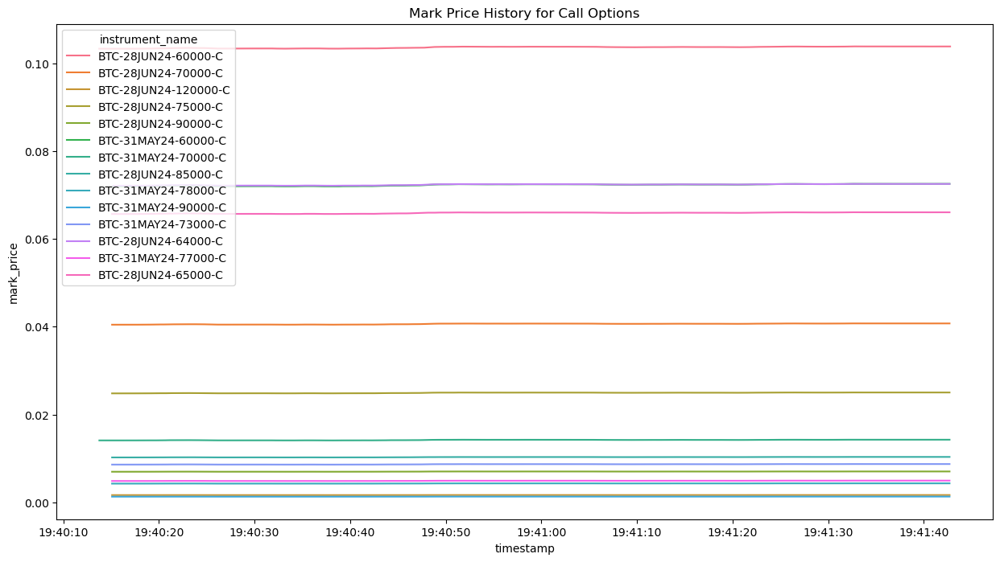

In [81]:
mark_prices_df = pd.concat(mark_prices)
#Lets plot the mark price history for all the calls
import matplotlib.pyplot as plt
import seaborn as sns
plt.figure(figsize=(15,8))
sns.lineplot(data=mark_prices_df, x='timestamp', y='mark_price', hue='instrument_name')
plt.title('Mark Price History for Call Options')
plt.show()

In [14]:
#Lets create a delta function
def delta(S, K, r, T, sigma, option_type):
    d1 = (np.log(S / K) + (r + 0.5 * sigma ** 2) * T) / (sigma * np.sqrt(T))
    if option_type == 'call':
        delta = np.exp(-r * T) * norm.cdf(d1)
    elif option_type == 'put':
        delta = np.exp(-r * T) * (norm.cdf(d1) - 1)
    return delta

In [38]:

def get_last_trades(currency, kind, start_time, end_time, count=1000):
    # Convert timestamps to milliseconds since epoch
    end_timestamp = int(time.mktime(end_time.timetuple()) * 1000)
    start_timestamp = int(time.mktime(start_time.timetuple()) * 1000)


    # Define a message to get option trading information
    options_message = {
        "jsonrpc": "2.0",
        "id": 2,
        "method": "public/get_last_trades_by_currency_and_time",
        "params": {
            'currency': currency,
            'kind': kind,
            'start_timestamp': start_timestamp,
            'end_timestamp': end_timestamp,
            'count': count,
            'sorting': 'asc'
        }
    }

    # Send the message to get options information
    ws.send(json.dumps(options_message))
    options_response = ws.recv()
    print(options_response)

    # Close the WebSocket connection
    ws.close()

    return options_response


def get_calls(options_response):
    parsed_response = json.loads(options_response)
    df_4 = pd.json_normalize(parsed_response['result']['trades'])
    df_4['timestamp'] = pd.to_datetime(df_4['timestamp'], unit='ms')
    calls = df_4[df_4['instrument_name'].str.endswith('C')].copy()
    calls.loc[:,'maturity'] = calls['instrument_name'].apply(lambda x: x.split('-')[1])
    calls.loc[:,'strike'] = calls['instrument_name'].apply(lambda x: x.split('-')[2])
    calls.loc[:,'strike'] = calls['strike'].apply(lambda x: x[:-1])
    calls.loc[:,'strike'] = calls['strike'].astype(float)
    calls.loc[:,'maturity'] = pd.to_datetime(calls['maturity'],format='%d%b%y')
    calls.loc[:,'Date'] = calls['timestamp']
    #Lets create a time to maturity column, and also a delta column
    calls.loc[:,'time_to_maturity'] = (pd.to_datetime(calls['maturity']) - pd.to_datetime(calls['Date'])).dt.days
    #calls.loc[:,'delta'] = delta(S=calls['index_price'], K=calls['strike'], r=0.01, T=calls['time_to_maturity']/365, sigma=calls['iv'], option_type='call')
    return calls

In [40]:
import requests
import time
from datetime import datetime, timedelta
# Calculate the timestamps for the last month
end_time = datetime.now()
#Lets near the end time to the nearst hour
end_time = end_time.replace(minute=0, second=0, microsecond=0)
#Lets reduce the start time to 1 hour before
start_time = end_time - timedelta(hours=1)

#Lets create this as a function
def time_lapse(start_time, end_time):
    # Convert timestamps to milliseconds since epoch
    end_timestamp = int(time.mktime(end_time.timetuple()) * 1000)
    start_timestamp = int(time.mktime(start_time.timetuple()) * 1000)
    return start_timestamp, end_timestamp

In [37]:
#Lets create a loop to get the calls for the last day, looping every hour
calls = []
empty = []

# Establish a connection to Deribit's WebSocket API
ws = websocket.create_connection('wss://www.deribit.com/ws/api/v2')

# Define your authentication message
auth_message = {
    "jsonrpc": "2.0",
    "id": 1,
    "method": "public/auth",
    "params": {
        "grant_type": "client_credentials",
        "client_id": api_key,
        "client_secret": api_secret
    }
}

# Send the authentication message
ws.send(json.dumps(auth_message))
response = ws.recv()
print(response)
for i in range(24*90):
    start_time = end_time - timedelta(hours=1)
    start_timestamp, end_timestamp = time_lapse(start_time, end_time)
    response = get_last_trades('BTC', 'option', start_time, end_time)
    # Lets wait 1 second before the next call
    test = json.loads(response)["result"]["trades"]
    if not test:
        print("Empty")
        empty.append(start_time)
    else:
        calls.append(get_calls(response))
        end_time = start_time
    time.sleep(1)

{"jsonrpc":"2.0","id":1,"result":{"token_type":"bearer","scope":"name:MQE block_trade:read connection trade:read wallet:read account:read custody:read mainaccount","refresh_token":"1747018630391.1Tq0gNA8.iBC-hJ12q7F7xg4YWo9TYVmrF21w3ehONHpe6RC_rQaymlMDzwPcPDX1NmBloVvUo-WmLCfER2y99z5h-iojd6SKpnrVTupkFh-_QB7Kstr4i7x-HYf6yYYOCbyQWmeCGiIQ7QMZrLG5FwlZ0U8EdEUCENTLT57ihi4Ba1NnHwe-o3hqEEq_j-zsZ6O5DdVBW3PkwFMFzHjk6z86OHHuxyeDPzlnmvduHQvk6KA1laeNtONPTH58ruP4T9rLJDIyDfHXSY3BLthS_2Oit3_HjIIM0PVMtVzl_vYhJzb3LSuVhEQ4yUTRFKW_YlY","expires_in":31536000,"access_token":"1747018630391.1UpkOHKo.NeikMQTAIeOh_YYTRO_Dtg2yC66jI-ahLhvg9W3OE9tdvkgujn4tFDeg8Sgvd0JVaSXBDMRigvBqjlyyCMt_D0-R-ArWhw4XjzKAv8JKjQ5O6TncfugRUF2GmKWpCIYgLDGIQ-mXCqc56aQsJRhz4_QQg14IhhdzrtgrqG5nEeOYDiTyyF5Tae9eTVDcKqhsRNR372sSx3HApht-KQJ0GYGY3edq8-OTtUMp8KLo77NPqbdW9TN47c3c7J6tRp2dTSQxQgdrwhJpagCVO0n9ZgxG1kufNWDSMSTTWSLb4_ZAWHvR5E-JEFfnCQAg"},"usIn":1715482630391202,"usOut":1715482630391475,"usDiff":273,"testnet":false}
{"jsonrpc":"2.0","id

KeyboardInterrupt: 

In [48]:
calls_df

,trade_id,contracts,instrument_name,tick_direction,trade_seq,mark_price,index_price,amount,direction,price,...,timestamp,block_trade_leg_count,block_trade_id,maturity,strike,Date,time_to_maturity,liquidation,combo_trade_id,combo_id
0,301162199,0.2,BTC-31MAY24-68000-C,3,1190,0.012731,60971.17,0.2,sell,0.0125,...,2024-05-12 01:00:23.939,NaN,NaN,2024-05-31 00:00:00,6800.0,2024-05-12 01:00:23.939,18,NaN,NaN,NaN
1,301162200,0.1,BTC-31MAY24-68000-C,3,1191,0.012731,60971.17,0.1,sell,0.0125,...,2024-05-12 01:00:24.927,NaN,NaN,2024-05-31 00:00:00,6800.0,2024-05-12 01:00:24.927,18,NaN,NaN,NaN
4,301162224,0.5,BTC-12MAY24-62000-C,0,178,0.000266,61023.26,0.5,buy,0.0003,...,2024-05-12 01:02:15.923,NaN,NaN,2024-05-12 00:00:00,6200.0,2024-05-12 01:02:15.923,-1,NaN,NaN,NaN
8,301162274,0.1,BTC-12MAY24-61500-C,0,143,0.000744,61000.33,0.1,sell,0.0005,...,2024-05-12 01:08:02.065,NaN,NaN,2024-05-12 00:00:00,6150.0,2024-05-12 01:08:02.065,-1,NaN,NaN,NaN
9,301162275,0.4,BTC-12MAY24-61500-C,1,144,0.000744,61000.33,0.4,sell,0.0005,...,2024-05-12 01:08:02.067,NaN,NaN,2024-05-12 00:00:00,6150.0,2024-05-12 01:08:02.067,-1,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
427,300675893,0.2,BTC-9MAY24-65500-C,1,40,0.004040,63224.85,0.2,sell,0.0038,...,2024-05-07 03:57:51.687,NaN,NaN,2024-05-09 00:00:00,6550.0,2024-05-07 03:57:51.687,1,NaN,NaN,NaN
429,300675895,0.1,BTC-24MAY24-67000-C,3,226,0.024491,63228.18,0.1,sell,0.0240,...,2024-05-07 03:57:58.050,NaN,NaN,2024-05-24 00:00:00,6700.0,2024-05-07 03:57:58.050,16,NaN,NaN,NaN
430,300675896,0.1,BTC-9MAY24-64500-C,1,57,0.007534,63225.73,0.1,sell,0.0075,...,2024-05-07 03:58:01.921,NaN,NaN,2024-05-09 00:00:00,6450.0,2024-05-07 03:58:01.921,1,NaN,NaN,NaN
431,300675900,0.1,BTC-28JUN24-70000-C,1,4385,0.049833,63220.72,0.1,buy,0.0495,...,2024-05-07 03:58:19.665,NaN,NaN,2024-06-28 00:00:00,7000.0,2024-05-07 03:58:19.665,51,NaN,NaN,NaN


In [43]:
calls_df = pd.concat(calls)
calls_df.head()
#Lets save calls_df to csv
calls_df.to_csv('calls_df.csv', index=False)

In [88]:
#Lets now plot a surface plot of the money price and the maturity date vs the implied volatility (iv)
#First, lets create a money columns, that is, the division of the index price by the strike price
calls_df.loc[:,'money'] = calls_df['index_price']/calls_df['strike']
#Now, lets create a 3d surface plot. Lets also predict the implied volatility using a linear regression for the surface plot
from mpl_toolkits.mplot3d import Axes3D
from sklearn.linear_model import LinearRegression
fig = plt.figure(figsize=(15,8))
ax = fig.add_subplot(111, projection='3d')
X = calls_df['money']
Y = calls_df['time_to_maturity']
Z = calls_df['iv']
ax.scatter(X, Y, Z, c='r', marker='o')
ax.set_xlabel('Money')
ax.set_ylabel('Time to Maturity')
ax.set_zlabel('Implied Volatility')
ax.set_title('Implied Volatility Surface Plot')
#Lets fit a linear regression model
model = LinearRegression()
model.fit(calls_df[['money','time_to_maturity']], calls_df['iv'])
X_pred = np.linspace(calls_df['money'].min(), calls_df['money'].max(), 100)
Y_pred = np.linspace(calls_df['time_to_maturity'].min(), calls_df['time_to_maturity'].max(), 100)
X_pred, Y_pred = np.meshgrid(X_pred, Y_pred)
Z_pred = model.predict(np.array([X_pred.flatten(), Y_pred.flatten()]).T)
ax.plot_surface(X_pred, Y_pred, Z_pred.reshape(X_pred.shape), alpha=0.5)
plt.show()


# GET LAST TRADES OF BITCOIN

In [18]:
import requests
import time
from datetime import datetime, timedelta
# Calculate the timestamps for the last month
end_time = datetime.now()
#Lets near the end time to the nearst hour
end_time = end_time.replace(minute=0, second=0, microsecond=0)
#Lets reduce the start time to 1 hour before
start_time = end_time - timedelta(hours=1)

#Lets create this as a function
def time_lapse(start_time, end_time):
    # Convert timestamps to milliseconds since epoch
    end_timestamp = int(time.mktime(end_time.timetuple()) * 1000)
    start_timestamp = int(time.mktime(start_time.timetuple()) * 1000)
    return start_timestamp, end_timestamp

In [35]:

def get_last_trades_by_currency_and_time(currency_name, start_time, end_time, count):
    # Convert timestamps to milliseconds since epoch
    end_timestamp = int(time.mktime(end_time.timetuple()) * 1000)
    start_timestamp = int(time.mktime(start_time.timetuple()) * 1000)

    #Get options

    # Establish a connection to Deribit's WebSocket API
    ws = websocket.create_connection('wss://www.deribit.com/ws/api/v2')

    # Define your authentication message
    auth_message = {
        "jsonrpc": "2.0",
        "id": 1,
        "method": "public/auth",
        "params": {
            "grant_type": "client_credentials",
            "client_id": api_key,
            "client_secret": api_secret
        }
    }

    # Send the authentication message
    ws.send(json.dumps(auth_message))
    response = ws.recv()
    print(response)

    # Define a message to get option trading information

    options_message = {
    "jsonrpc": "2.0",
    "id": 2,
    "method": "public/get_last_trades_by_currency_and_time",
    "params": {
        'currency': currency_name,
        'kind': 'any',
        'start_timestamp': start_timestamp,
        'end_timestamp': end_timestamp
        }
    }

    # Send the message to get options information
    ws.send(json.dumps(options_message))
    options_response = ws.recv()

    # Close the WebSocket connection
    ws.close()
    
    return options_response


In [36]:

def get_last_trades_by_instrument_and_time(instrument_name, start_time, end_time, count):
    # Convert timestamps to milliseconds since epoch
    end_timestamp = int(time.mktime(end_time.timetuple()) * 1000)
    start_timestamp = int(time.mktime(start_time.timetuple()) * 1000)

    #Get options

    # Establish a connection to Deribit's WebSocket API
    ws = websocket.create_connection('wss://www.deribit.com/ws/api/v2')

    # Define your authentication message
    auth_message = {
        "jsonrpc": "2.0",
        "id": 1,
        "method": "public/auth",
        "params": {
            "grant_type": "client_credentials",
            "client_id": api_key,
            "client_secret": api_secret
        }
    }

    # Send the authentication message
    ws.send(json.dumps(auth_message))
    response = ws.recv()
    print(response)

    # Define a message to get option trading information
    options_message = {
        "jsonrpc": "2.0",
        "id": 2,
        "method": "public/get_last_trades_by_instrument_and_time",
        "params": {
            'instrument_name': instrument_name,
            'start_timestamp': start_timestamp,
            'end_timestamp': end_timestamp,
            'count' : count
        }
    }

    # Send the message to get options information
    ws.send(json.dumps(options_message))
    options_response = ws.recv()

    # Close the WebSocket connection
    ws.close()
    
    return options_response


In [37]:
import pandas as pd
#Lets recreate this proces from option_response to trades_df as a function
def data_to_df(options_response):
    parsed_response = json.loads(options_response)
    trades_data = parsed_response['result']['trades']

    # Converting the list of dictionaries to a pandas DataFrame
    trades_df = pd.DataFrame(trades_data)
    #Lets convert timestamp to datetime
    trades_df['timestamp'] = pd.to_datetime(trades_df['timestamp'], unit='ms')
    return trades_df

In [38]:
#Lets create a loop for the last 24 hours
# Calculate the timestamps for the last month
end_time = datetime.now()
#Lets near the end time to the nearst hour
end_time = end_time.replace(minute=0, second=0, microsecond=0)
#Lets reduce the start time to 1 hour before
start_time = end_time - timedelta(hours=1)
ticker1 = "BTC-PERPETUAL"

In [47]:
BTC_data = pd.DataFrame()
for i in range(24):
    start_time = end_time - timedelta(hours=1)
    start_timestamp, end_timestamp = time_lapse(start_time, end_time)
    options_response = get_last_trades_by_instrument_and_time(ticker1, start_time, end_time, 1)
    trades_df = data_to_df(options_response)
    BTC_data = pd.concat([BTC_data, trades_df])
    end_time = start_time

{"jsonrpc":"2.0","id":1,"result":{"token_type":"bearer","scope":"block_trade:read connection trade:read wallet:read account:read custody:read mainaccount","refresh_token":"1746382037764.1erbPdvz.z-C6BJqJotiOjXDrQpuR1rExRiEAHTAomjFUdBseo5l1pk4rUyu0hll9U9bxZ5ULIFZrep1GlhysTURvzxvMTnGSAB9Stoer7HrmG8VtT4ZSEWpsyfZkF1Mz_MUjBQv7gKMAEnggBuSN5xxlXVA014fzTs9cqxVG4FX0GtMfXerTQM5wz1SgDkSs80X9Sotwu_Ph-qFP-KB_VnXIuGsIwpC0SLZAj0KKVKOVavk8coV7QF0wWQ88yipt0DhsPjZnYAMRbcevNUCQ_HBupsjP6pHd8SjNWUroF9HBMTo7TRE","expires_in":31536000,"access_token":"1746382037764.1UxwsnNn.tYhkt7ftvierTrIU1nbk4FVAhZZJ_AdcBcyQnnaTm4iM4DKjMqS5VEdmr8RuwibJEn5iJzzSfxqE5aCtoN1XCwwGOr4r4fKLyNSqCB0m0x2BPAdzkp2kEn-xD9gryHiM_nYMfXC8ZASEo6pSctt8EsPidT6etj12NGwjDPhIKVkUwNRIpnEwPnnlRB45XhE6uIX1TRP84cmLi1ESe86O_G4wq8vR_Af94fvo7MpdsqWXufYzlpuRMRXAHN8LkyHRtM7tnMilH-yH-qAjbcQ80JalSseJm51aWlrBLiRADR_3"},"usIn":1714846037764175,"usOut":1714846037764392,"usDiff":217,"testnet":false}
{"jsonrpc":"2.0","id":1,"result":{"token_type":"bearer","scop

In [50]:
#Lets create a loop for the last 24 hours
# Calculate the timestamps for the last month
end_time = datetime.now()
#Lets near the end time to the nearst hour
end_time = end_time.replace(minute=0, second=0, microsecond=0)
#Lets reduce the start time to 1 hour before
start_time = end_time - timedelta(hours=1)
curr1 = "BTC"

In [51]:
BTC_currdata = pd.DataFrame()
for i in range(24):
    start_time = end_time - timedelta(hours=1)
    start_timestamp, end_timestamp = time_lapse(start_time, end_time)
    options_response = get_last_trades_by_currency_and_time(curr1, start_time, end_time, 1)
    trades_df = data_to_df(options_response)
    BTC_currdata = pd.concat([BTC_currdata, trades_df])
    end_time = start_time

{"jsonrpc":"2.0","id":1,"result":{"token_type":"bearer","scope":"block_trade:read connection trade:read wallet:read account:read custody:read mainaccount","refresh_token":"1746382508777.1Sk5t-bs.3LHnsgGMnK5nJ_mGktrvHBehH1s6h33FeENhsoZfbU23XiBYi1MSGahivWcLx8XSGxl22lL3PzhjNg8qTZGYvv0kq14ASIiaGegwi72o2EVabU9H2QX_BRFvQlQvts_y-fQJPiwImwfr7rgs0wvaUsYucLjKfbm9dy9VpIwHp9FkkEwY4t9M8N4cwx-l8vwcdD97jNuHBJK9Hs1bdcZ5YGGGaAZjkSBgSoxM5YPAep-nnDalx0cH1lnU_OcYzjtMk5Wid1mS27Ho8ElDj2B5KA7LbERWJN_3M9cfZTcuP2k","expires_in":31536000,"access_token":"1746382508777.1ScOv4E5.s9R8RJTDAe2S6CrUk5gPDr73HJCjfiwAiz0HeFxBoPIQO2kqHS1BQb1HLotmNKSsMSdRKCCyGnlLEsIA_1zfow3JIm0IPHRHaJKuhyYpPD27VcuPj05t8odmSVTIAW5BYFvmqd-Rake3FUbpNrDl1H7Ci7M3sdo0JPCUbqQJvsfFFiVjMt6bLwHgRzVXc6DVA21_bh1LqnaE5BfNzpQraJwQLlo0Qu2Nf5fEPCiGItFufSRTMwVRCrurHZ7pJ0PF7b01uAr94mBs2g3HMtGITmo7rG3kv2fytoR31IK5LjqV"},"usIn":1714846508777160,"usOut":1714846508777456,"usDiff":296,"testnet":false}
{"jsonrpc":"2.0","id":1,"result":{"token_type":"bearer","scop

In [52]:
BTC_currdata

,trade_id,contracts,instrument_name,tick_direction,trade_seq,mark_price,index_price,direction,amount,price,timestamp,iv,combo_trade_id,combo_id
0,300454548,213.0,BTC-PERPETUAL,0,206751721,63691.38000,63693.89,sell,2130.0,63694.5000,2024-05-04 17:00:04.362,NaN,NaN,NaN
1,300454549,38.0,BTC-PERPETUAL,1,206751722,63691.38000,63693.89,sell,380.0,63694.5000,2024-05-04 17:00:04.366,NaN,NaN,NaN
2,300454550,2.0,BTC-17MAY24,0,5862,63896.99000,63693.89,sell,20.0,63902.5000,2024-05-04 17:00:04.371,NaN,NaN,NaN
3,300454551,0.1,BTC-5MAY24-59000-P,3,161,0.00015,63689.03,sell,0.1,0.0001,2024-05-04 17:00:21.784,78.83,NaN,NaN
4,300454552,213.0,BTC-PERPETUAL,0,206751723,63698.71000,63698.62,buy,2130.0,63695.0000,2024-05-04 17:00:25.289,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5,300335897,436.0,BTC-PERPETUAL,3,206674421,61834.63000,61830.64,sell,4360.0,61841.0000,2024-05-03 18:00:01.847,NaN,NaN,NaN
6,300335898,188.0,BTC-PERPETUAL,3,206674422,61834.63000,61830.64,sell,1880.0,61841.0000,2024-05-03 18:00:01.849,NaN,NaN,NaN
7,300335899,1.0,BTC-PERPETUAL,3,206674423,61834.63000,61830.64,sell,10.0,61841.0000,2024-05-03 18:00:01.849,NaN,NaN,NaN
8,300335900,1.0,BTC-PERPETUAL,2,206674424,61830.49000,61826.45,sell,10.0,61836.0000,2024-05-03 18:00:04.424,NaN,NaN,NaN


In [49]:
BTC_data

,trade_id,contracts,instrument_name,tick_direction,trade_seq,mark_price,index_price,direction,amount,price,timestamp
0,300134233,1.0,BTC-PERPETUAL,0,206534559,59011.91,59026.20,buy,10.0,59014.0,2024-05-02 17:00:00.245
0,300129103,4.0,BTC-PERPETUAL,0,206531536,59243.44,59267.63,buy,40.0,59250.0,2024-05-02 16:00:00.026
0,300122537,166.0,BTC-PERPETUAL,0,206527581,59039.05,59062.05,sell,1660.0,59041.5,2024-05-02 15:00:08.106
0,300111190,45.0,BTC-PERPETUAL,0,206520039,58423.71,58444.29,sell,450.0,58427.0,2024-05-02 14:00:04.717
0,300103360,600.0,BTC-PERPETUAL,2,206514747,58516.77,58543.34,sell,6000.0,58518.0,2024-05-02 13:00:01.283
0,300090756,1406.0,BTC-PERPETUAL,1,206506409,58528.88,58538.42,buy,14060.0,58525.5,2024-05-02 12:00:00.267
0,300075137,200.0,BTC-PERPETUAL,2,206496068,57761.99,57783.23,buy,2000.0,57760.0,2024-05-02 11:00:02.179
0,300070833,417.0,BTC-PERPETUAL,1,206493609,57759.91,57772.24,buy,4170.0,57756.5,2024-05-02 10:00:18.725
0,300067520,120.0,BTC-PERPETUAL,0,206491788,57788.60,57802.72,buy,1200.0,57790.0,2024-05-02 09:00:01.734
0,300062262,2462.0,BTC-PERPETUAL,0,206488550,57616.88,57637.15,sell,24620.0,57611.0,2024-05-02 08:00:15.558


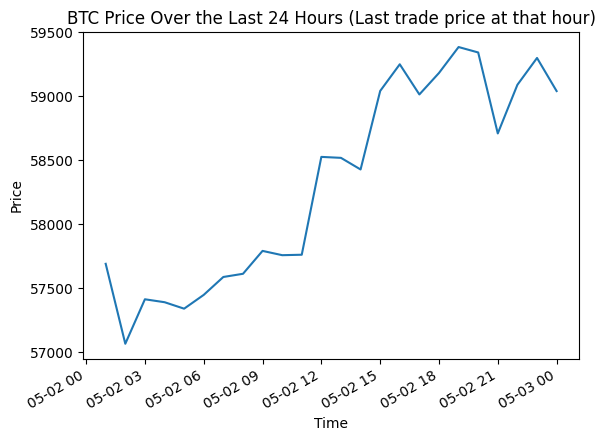

In [23]:

#Lets plot the BTC price
import matplotlib.pyplot as plt
plt.plot(BTC_data['timestamp'], BTC_data['price'])
#Lets format the x axis to make it more readable
plt.gcf().autofmt_xdate()
#Lets add labels
plt.title('BTC Price Over the Last 24 Hours (Last trade price at that hour)')
plt.xlabel('Time')
plt.ylabel('Price')
plt.show()